In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from google.colab import drive
from tensorflow.keras.applications import VGG16, ResNet50
import os
import numpy as np
import cv2
import seaborn as sns


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
IMAGE_SIZE=256
BATCH_SIZE=32
CHANNELS=3
EPOCHS=50

In [ ]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    "/content/gdrive/MyDrive/potato disease",
shuffle=True,
image_size= (IMAGE_SIZE,IMAGE_SIZE),
batch_size= BATCH_SIZE
)

Found 2150 files belonging to 3 classes.


In [ ]:
class_names=dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [ ]:
for image_batch, labels_batch in dataset.take(1):
    print("Image batch shape:", image_batch.shape)
    print("Labels batch:", labels_batch.numpy())


Image batch shape: (32, 256, 256, 3)
Labels batch: [0 1 1 1 1 0 1 0 0 0 1 0 0 1 1 0 1 1 0 1 1 0 1 1 1 1 2 0 1 1 0 0]


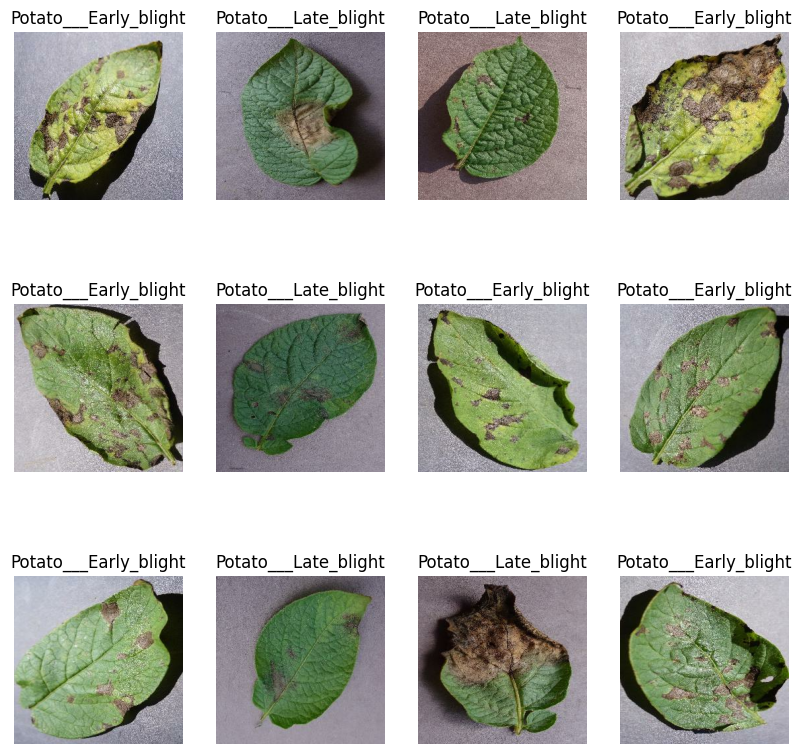

In [ ]:
plt.figure(figsize=(10,10))
for image_batch,label_batch in dataset.take(1):
    for i in range(12):
        ax= plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

In [ ]:
#80% ==>training
#20% ==>test
   # 10% ==> validation
   # 10% ==>test

In [ ]:
train_size=0.8
len(dataset)*train_size

54.400000000000006

In [ ]:
train_ds=dataset.take(54)
len(train_ds)

54

In [ ]:
test_ds=dataset.skip(54)
len(test_ds)

14

In [ ]:
val_size=0.1
len(dataset)*val_size


6.800000000000001

In [ ]:
val_ds=test_ds.take(6)
len(val_ds)

6

In [ ]:
test_ds=test_ds.skip(6)
len(test_ds)

8

In [ ]:
def get_dataset_partitions_tf(ds,train_split=0.8,val_split=0.1,test_split=0.1,shuffle=True,shuffle_size=10000):
  assert(train_split+test_split+val_split)==1

  ds_size=len(ds)

  if shuffle:
    ds=ds.shuffle(shuffle_size,seed=12)

    train_size=int(train_split*ds_size)
    val_size=int(val_split*ds_size)

    train_ds=ds.take(train_size)
    val_ds=ds.skip(train_size).take(val_size)
    test_ds=ds.skip(train_size).skip(val_size)

    return train_ds,val_ds,test_ds

In [ ]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)
print("Number of samples in training set:", len(train_ds))
print("Number of samples in validation set:", len(val_ds))
print("Number of samples in test set:", len(test_ds))


Number of samples in training set: 54
Number of samples in validation set: 6
Number of samples in test set: 8


In [ ]:
# Cache, shuffle, and prefetch the datasets
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
# Define the preprocessing and data augmentation layers
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0 / 255)
])

data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2),
])

In [ ]:
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

94765736/94765736 [==============================] - 3s 0us/step


In [ ]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
input_shape=(BATCH_SIZE,IMAGE_SIZE,IMAGE_SIZE,CHANNELS)
n_classes=3
model=models.Sequential([
    resize_and_rescale,
    data_augmentation,
   layers.Conv2D(32,(3,3),activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
       layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
       layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
     layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
     layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
     layers.Dense(64,activation='relu'),
    layers.Dense(n_classes,activation='softmax'),
    ])
model.build(input_shape=input_shape)

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (32, 127, 127, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (32, 62, 62, 64)          0         
 g2D)                                                 

In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
history=model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_ds

)

Epoch 1/50
54/54 [==============================] - 331s 418ms/step - loss: 0.9142 - accuracy: 0.4641 - val_loss: 0.8868 - val_accuracy: 0.4635
Epoch 2/50
54/54 [==============================] - 15s 286ms/step - loss: 0.8344 - accuracy: 0.5295 - val_loss: 0.6897 - val_accuracy: 0.7292
Epoch 3/50
54/54 [==============================] - 16s 293ms/step - loss: 0.5756 - accuracy: 0.7159 - val_loss: 0.8278 - val_accuracy: 0.7188
Epoch 4/50
54/54 [==============================] - 16s 289ms/step - loss: 0.4463 - accuracy: 0.8067 - val_loss: 0.6143 - val_accuracy: 0.8125
Epoch 5/50
54/54 [==============================] - 16s 288ms/step - loss: 0.3877 - accuracy: 0.8229 - val_loss: 0.3216 - val_accuracy: 0.8490
Epoch 6/50
54/54 [==============================] - 16s 303ms/step - loss: 0.2749 - accuracy: 0.8976 - val_loss: 0.2262 - val_accuracy: 0.9323
Epoch 7/50
54/54 [==============================] - 15s 285ms/step - loss: 0.2326 - accuracy: 0.9120 - val_loss: 0.2253 - val_accuracy: 0.916

In [ ]:
scores=model.evaluate(test_ds)
scores
history


8/8 [==============================] - 7s 28ms/step - loss: 0.2232 - accuracy: 0.9297


In [ ]:
vgg_model.trainable = False
resnet_model.trainable = False


In [ ]:
vgg_global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
resnet_global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

vgg_prediction_layer = tf.keras.layers.Dense(len(class_names), activation='softmax')
resnet_prediction_layer = tf.keras.layers.Dense(len(class_names), activation='softmax')

In [ ]:
vgg_model_with_top = tf.keras.Sequential([
    vgg_model,
    vgg_global_average_layer,
    vgg_prediction_layer
])

resnet_model_with_top = tf.keras.Sequential([
    resnet_model,
    resnet_global_average_layer,
    resnet_prediction_layer
])


In [ ]:
vgg_model_with_top.compile(optimizer='adam',
                           loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                           metrics=['accuracy'])

resnet_model_with_top.compile(optimizer='adam',
                              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                              metrics=['accuracy'])

In [ ]:
vgg_history = vgg_model_with_top.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    validation_data=val_ds
)



Epoch 1/50
54/54 [==============================] - 30s 401ms/step - loss: 0.9340 - accuracy: 0.6939 - val_loss: 0.6036 - val_accuracy: 0.8125
Epoch 2/50
54/54 [==============================] - 22s 397ms/step - loss: 0.3847 - accuracy: 0.8432 - val_loss: 0.4599 - val_accuracy: 0.8438
Epoch 3/50
54/54 [==============================] - 21s 386ms/step - loss: 0.2422 - accuracy: 0.9080 - val_loss: 0.2922 - val_accuracy: 0.8906
Epoch 4/50
54/54 [==============================] - 22s 399ms/step - loss: 0.2071 - accuracy: 0.9219 - val_loss: 0.2309 - val_accuracy: 0.9062
Epoch 5/50
54/54 [==============================] - 22s 398ms/step - loss: 0.1881 - accuracy: 0.9288 - val_loss: 0.2261 - val_accuracy: 0.9115
Epoch 6/50
54/54 [==============================] - 22s 409ms/step - loss: 0.1496 - accuracy: 0.9421 - val_loss: 0.2222 - val_accuracy: 0.9115
Epoch 7/50
54/54 [==============================] - 22s 408ms/step - loss: 0.1427 - accuracy: 0.9497 - val_loss: 0.1875 - val_accuracy: 0.9375

In [ ]:
resnet_history = resnet_model_with_top.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    validation_data=val_ds
)

Epoch 1/50
54/54 [==============================] - 25s 334ms/step - loss: 0.3743 - accuracy: 0.8877 - val_loss: 0.1871 - val_accuracy: 0.9635
Epoch 2/50
54/54 [==============================] - 18s 333ms/step - loss: 0.1383 - accuracy: 0.9670 - val_loss: 0.1329 - val_accuracy: 0.9583
Epoch 3/50
54/54 [==============================] - 19s 343ms/step - loss: 0.0984 - accuracy: 0.9757 - val_loss: 0.1076 - val_accuracy: 0.9688
Epoch 4/50
54/54 [==============================] - 18s 327ms/step - loss: 0.0717 - accuracy: 0.9826 - val_loss: 0.1022 - val_accuracy: 0.9688
Epoch 5/50
54/54 [==============================] - 18s 334ms/step - loss: 0.0667 - accuracy: 0.9797 - val_loss: 0.0902 - val_accuracy: 0.9688
Epoch 6/50
54/54 [==============================] - 19s 353ms/step - loss: 0.0624 - accuracy: 0.9844 - val_loss: 0.0882 - val_accuracy: 0.9740
Epoch 7/50
54/54 [==============================] - 20s 367ms/step - loss: 0.0536 - accuracy: 0.9850 - val_loss: 0.0776 - val_accuracy: 0.9740

In [ ]:
# Evaluate VGG16 and ResNet50 models
print("Evaluate VGG16 Model:")
vgg_model_with_top.evaluate(test_ds)

print("Evaluate ResNet50 Model:")
resnet_model_with_top.evaluate(test_ds)

Evaluate VGG16 Model:
8/8 [==============================] - 1s 163ms/step - loss: 0.0417 - accuracy: 0.9922
Evaluate ResNet50 Model:
8/8 [==============================] - 1s 115ms/step - loss: 0.0172 - accuracy: 0.9961


[0.017171064391732216, 0.99609375]

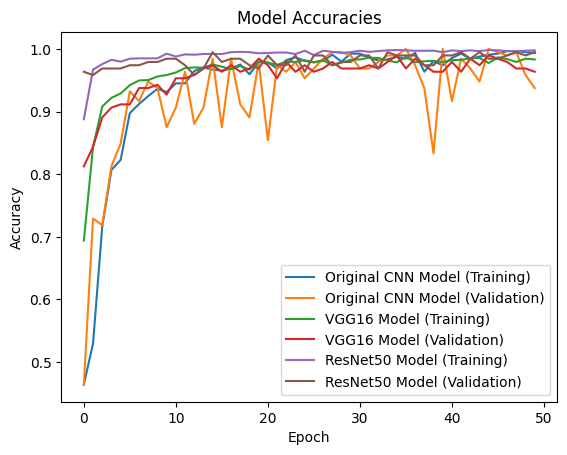

In [ ]:
# Plot accuracies
plt.plot(history.history['accuracy'], label='Original CNN Model (Training)')
plt.plot(history.history['val_accuracy'], label='Original CNN Model (Validation)')
plt.plot(vgg_history.history['accuracy'], label='VGG16 Model (Training)')
plt.plot(vgg_history.history['val_accuracy'], label='VGG16 Model (Validation)')
plt.plot(resnet_history.history['accuracy'], label='ResNet50 Model (Training)')
plt.plot(resnet_history.history['val_accuracy'], label='ResNet50 Model (Validation)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Model Accuracies')
plt.legend()
plt.show()


In [ ]:
history.params

{'verbose': 1, 'epochs': 50, 'steps': 54}

In [ ]:

history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [ ]:

acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']

Text(0.5, 1.0, 'Training and Validation Loss')

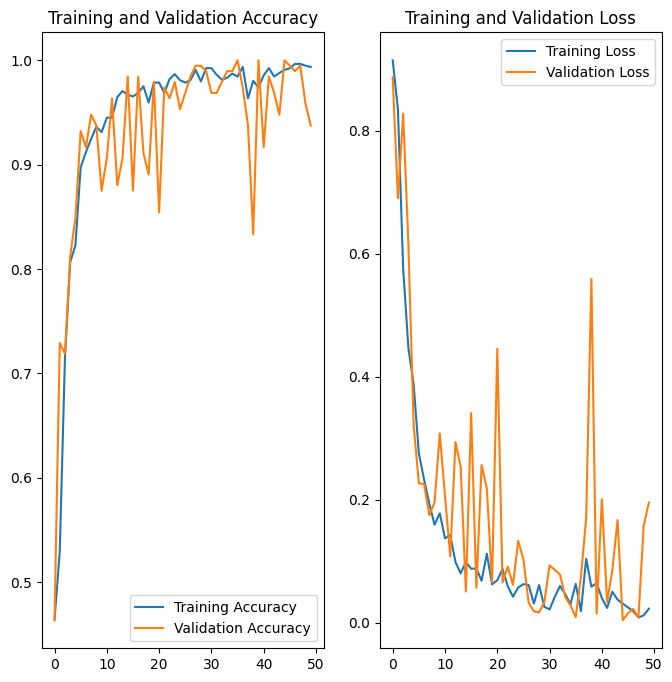

In [ ]:
plt.figure(figsize=(8,8))

plt.subplot(1,2,1)
plt.plot(range(len(acc)), acc, label='Training Accuracy')
plt.plot(range(len(val_acc)), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(range(len(loss)), loss, label='Training Loss')
plt.plot(range(len(val_loss)), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')


In [ ]:
import numpy as np
np.argmax([9.9999964e-01,3.9333537e-07,1.1586251e-18])

0

first image to predict
actual label: Potato___Late_blight
1/1 [==============================] - 0s 146ms/step
predicted label: Potato___Early_blight


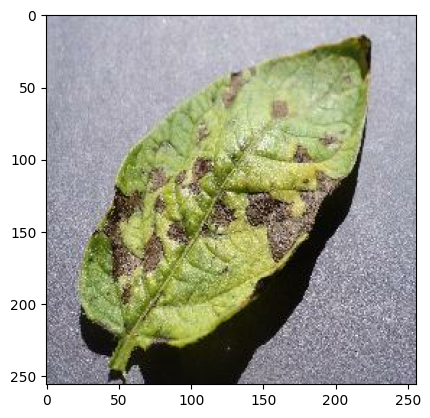

In [ ]:

for images_batch,label_batch in test_ds.take(1):
  first_image=image_batch[0].numpy().astype('uint8')

  print("first image to predict")
  plt.imshow(first_image)
  print("actual label:",class_names[label_batch[0].numpy()])
  batch_prediction=model.predict(image_batch)
  print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 18ms/step


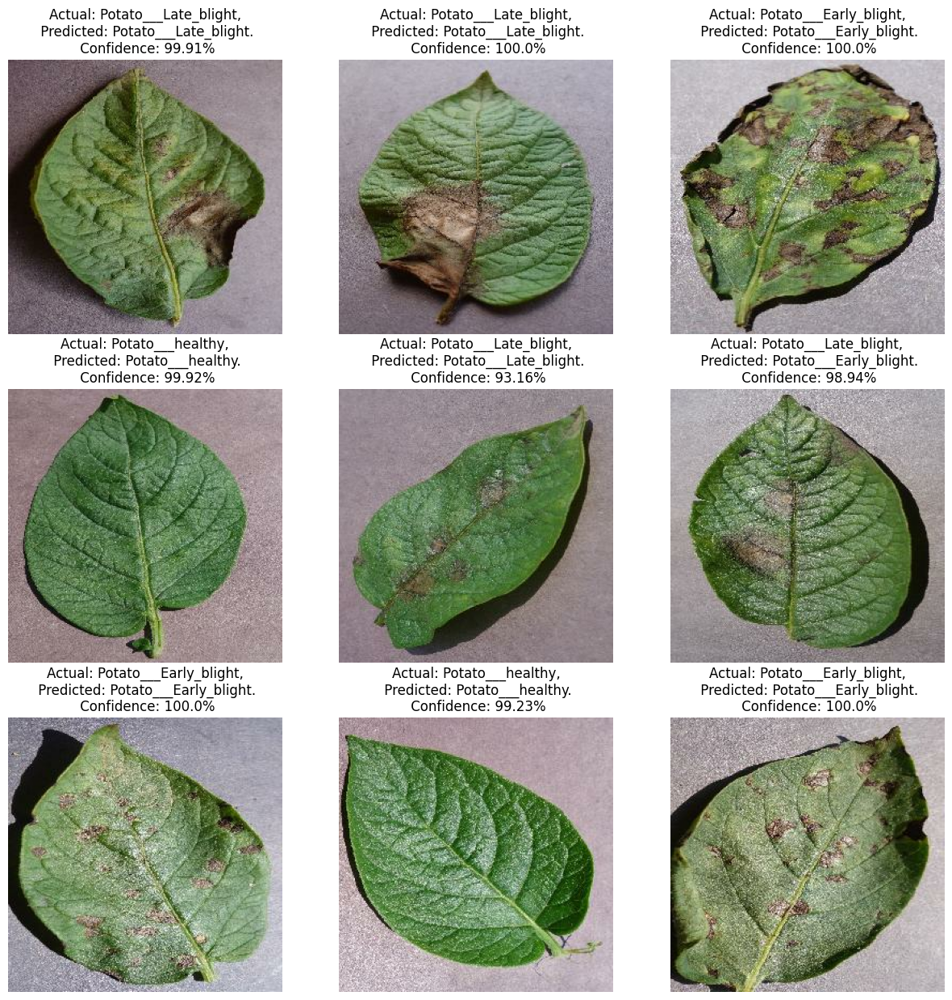

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

1/1 [==============================] - 0s 20ms/step


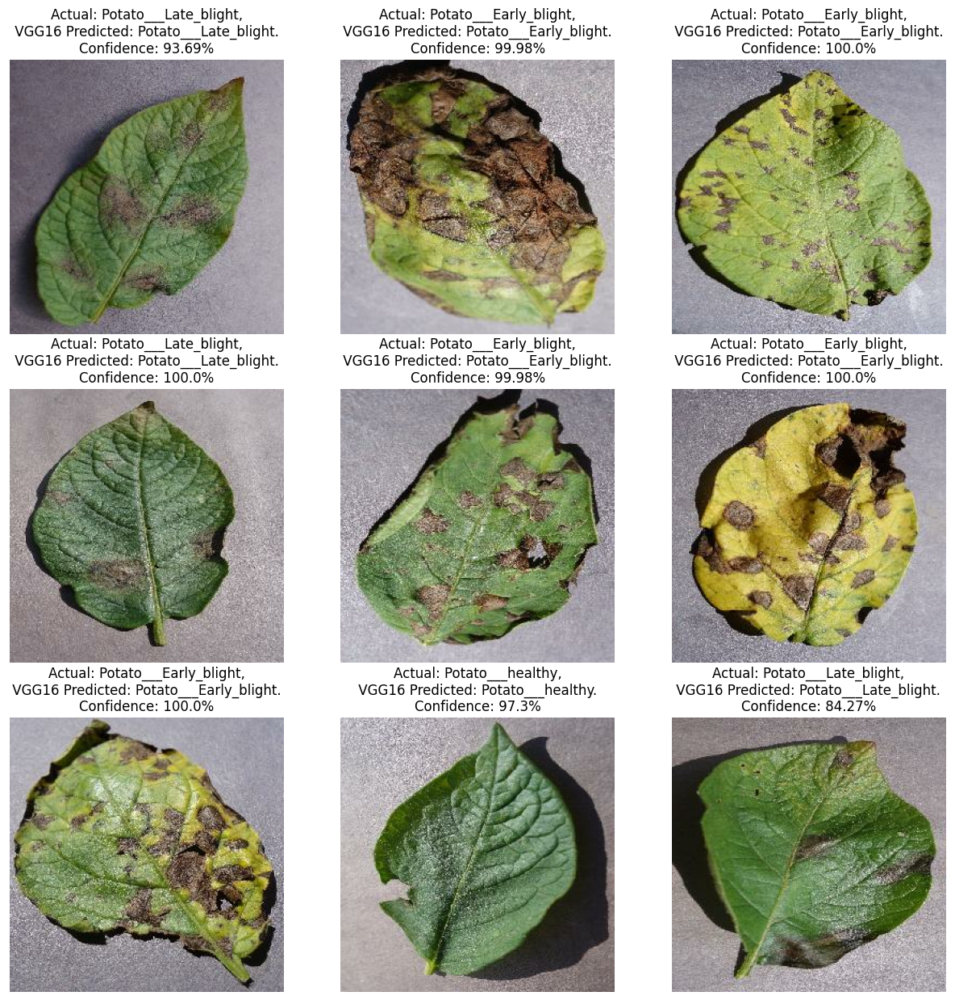

In [ ]:
# Function to predict using VGG16 model
def predict_vgg(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    return predicted_class, confidence

# Visualize predictions for VGG16 model
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        # Predict using VGG16 model
        vgg_predicted_class, vgg_confidence = predict_vgg(vgg_model_with_top, images[i].numpy())

        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n VGG16 Predicted: {vgg_predicted_class}. \nConfidence: {vgg_confidence}%")
        plt.axis("off")

plt.show()

1/1 [==============================] - 0s 22ms/step


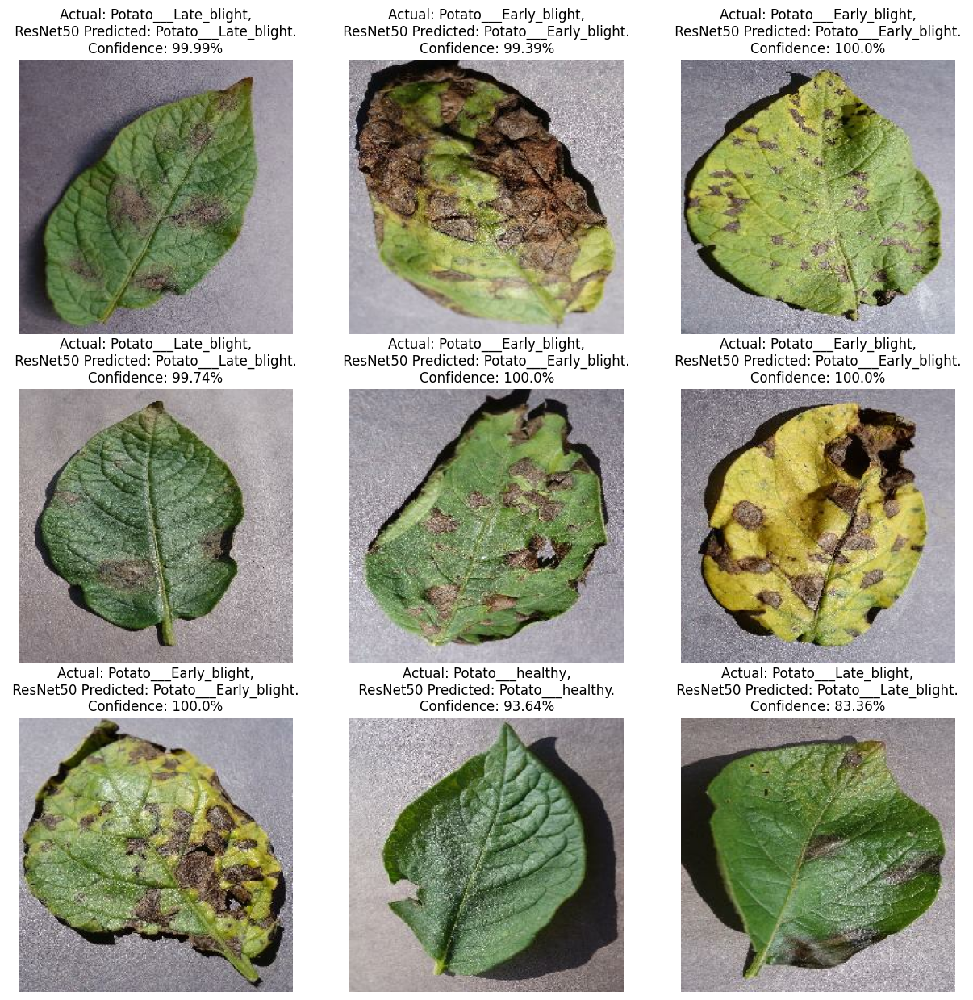

In [ ]:
# Function to predict using ResNet50 model
def predict_resnet(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    return predicted_class, confidence

# Visualize predictions for ResNet50 model
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        # Predict using ResNet50 model
        resnet_predicted_class, resnet_confidence = predict_resnet(resnet_model_with_top, images[i].numpy())

        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n ResNet50 Predicted: {resnet_predicted_class}. \nConfidence: {resnet_confidence}%")
        plt.axis("off")

plt.show()


1/1 [==============================] - 0s 19ms/step


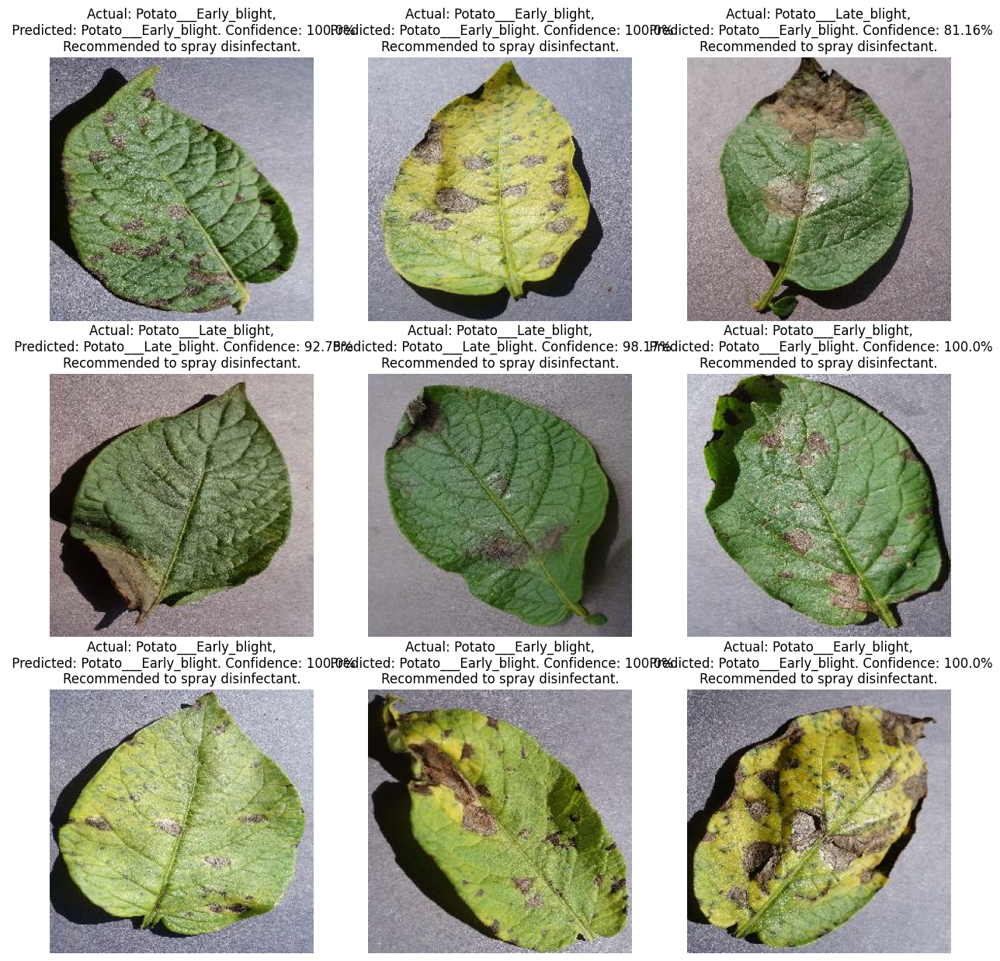

In [ ]:
def predict_and_recommend(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)

    # Check if the predicted class is healthy or diseased
    if predicted_class == 'Potato___healthy':
        recommendation = "No need to spray disinfectant. The leaf is healthy."
    else:
        recommendation = "Recommended to spray disinfectant."

    return predicted_class, confidence, recommendation

plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence, recommendation = predict_and_recommend(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}. Confidence: {confidence}%\n{recommendation}")
        plt.axis("off")
